In [1]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

True
Tesla T4


In [1]:
import torch
import torchvision

In [4]:
!unzip food.zip

Archive:  food.zip
  inflating: food_c101_n1000_r384x384x3.h5  
  inflating: food_c101_n10099_r32x32x1.h5  
  inflating: food_c101_n10099_r32x32x3.h5  
  inflating: food_c101_n10099_r64x64x1.h5  
  inflating: food_c101_n10099_r64x64x3.h5  
  inflating: food_test_c101_n1000_r128x128x1.h5  
  inflating: food_test_c101_n1000_r128x128x3.h5  
  inflating: food_test_c101_n1000_r32x32x1.h5  
  inflating: food_test_c101_n1000_r32x32x3.h5  
  inflating: food_test_c101_n1000_r64x64x1.h5  
  inflating: food_test_c101_n1000_r64x64x3.h5  
  inflating: images/apple_pie/1005649.jpg  
  inflating: images/apple_pie/1011328.jpg  
  inflating: images/apple_pie/101251.jpg  
  inflating: images/apple_pie/1014775.jpg  
  inflating: images/apple_pie/1026328.jpg  
  inflating: images/apple_pie/1028787.jpg  
  inflating: images/apple_pie/1034399.jpg  
  inflating: images/apple_pie/103801.jpg  
  inflating: images/apple_pie/1038694.jpg  
  inflating: images/apple_pie/1043283.jpg  
  inflating: images/apple_pie/

In [2]:
!pip install h5py scikit-learn matplotlib -q

^C



[notice] A new release of pip is available: 26.1.2 -> 26.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
META_DIR = os.path.join(DATA_DIR, "meta")

In [11]:
import os

DATA_DIR = "."
IMAGES_DIR = os.path.join(DATA_DIR, "images")
META_DIR = os.path.join(DATA_DIR, "meta")

print("Contenu de meta/ :", os.listdir(META_DIR))

Contenu de meta/ : ['meta']


In [2]:
import os

DATA_DIR = "food"
IMAGES_DIR = os.path.join(DATA_DIR, "images")
META_DIR = os.path.join(DATA_DIR, "meta", "meta")

with open(os.path.join(META_DIR, "classes.txt")) as f:
    classes = [line.strip() for line in f.readlines()]

print(f"Nombre de classes : {len(classes)}")
print("Exemples :", classes[:5])

Nombre de classes : 101
Exemples : ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare']


In [4]:
def load_split(split_file):
    with open(os.path.join(META_DIR, split_file), "r") as f:
        lines = [line.strip() for line in f.readlines()]
    return lines

train_files = load_split("train.txt")
test_files = load_split("test.txt")

print(f"Images train : {len(train_files)}")
print(f"Images test  : {len(test_files)}")
print("Exemple :", train_files[:3])

Images train : 75750
Images test  : 25250
Exemple : ['apple_pie/1005649', 'apple_pie/1014775', 'apple_pie/1026328']


In [ ]:
import os
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image

# --- Dataset ---
class Food101Dataset(Dataset):
    def __init__(self, file_list, images_dir, classes, transform=None):
        self.file_list = file_list
        self.images_dir = images_dir
        self.classes = classes
        self.class_to_idx = {c: i for i, c in enumerate(classes)}
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        rel_path = self.file_list[idx]
        cls = rel_path.split("/")[0]
        img_path = os.path.join(self.images_dir, rel_path + ".jpg")
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        label = self.class_to_idx[cls]
        return img, label

# --- Transforms ---
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = Food101Dataset(train_files, IMAGES_DIR, classes, train_transform)
test_dataset = Food101Dataset(test_files, IMAGES_DIR, classes, test_transform)


BATCH_SIZE = 128

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=4, pin_memory=True, persistent_workers=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=4, pin_memory=True, persistent_workers=True
)

print(f"Batches train : {len(train_loader)}  | Batches test : {len(test_loader)}")


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device utilisé :", device)

model = models.resnet50(weights="IMAGENET1K_V2")

for param in model.parameters():
    param.requires_grad = False

num_features = model.fc.in_features
model.fc = nn.Linear(num_features, len(classes))
model = model.to(device)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"Paramètres entraînables : {trainable:,} / {total:,} ({100*trainable/total:.2f}%)")

Batches train : 592  | Batches test : 198
Device utilisé : cuda


Paramètres entraînables : 206,949 / 23,714,981 (0.87%)


In [ ]:
import torch.optim as optim
from tqdm import tqdm

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.Adam(model.fc.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=8)


scaler = torch.cuda.amp.GradScaler()

def train_one_epoch(model, loader, criterion, optimizer, device, scaler):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in tqdm(loader, desc="Training"):
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total

def evaluate(model, loader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Validation"):
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return running_loss / total, correct / total

os.makedirs("checkpoints", exist_ok=True)

num_epochs = 8
history_phase1 = []
best_val_acc_p1 = 0.0

for epoch in range(num_epochs):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device, scaler)
    val_loss, val_acc = evaluate(model, test_loader, criterion, device)
    scheduler.step()

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

    history_phase1.append({
        "epoch": epoch + 1, "train_loss": train_loss, "train_acc": train_acc,
        "val_loss": val_loss, "val_acc": val_acc
    })

    if val_acc > best_val_acc_p1:
        best_val_acc_p1 = val_acc
        torch.save(model.state_dict(), "checkpoints/food_resnet50_phase1_best.pth")

print(f"\nPhase 1 terminée | Meilleure Val Acc : {best_val_acc_p1:.4f}")
print("Checkpoint sauvegardé : checkpoints/food_resnet50_phase1_best.pth")

/tmp/ipykernel_1685509/3456064448.py:9: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Training:   0%|          | 0/592 [00:00<?, ?it/s]/tmp/ipykernel_1685509/3456064448.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Training:   6%|▌         | 33/592 [00:22<04:48,  1.94it/s] 

Validation:   0%|          | 0/198 [00:00<?, ?it/s]/tmp/ipykernel_1685509/3456064448.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation: 100%|██████████| 198/198 [01:35<00:00,  2.08it/s]


Epoch 1/8 | Train Loss: 3.0716 Acc: 0.4304 | Val Loss: 2.3794 Acc: 0.5882


Validation: 100%|██████████| 198/198 [01:33<00:00,  2.11it/s]


Epoch 2/8 | Train Loss: 2.4038 Acc: 0.5625 | Val Loss: 2.1510 Acc: 0.6324


Validation: 100%|██████████| 198/198 [01:31<00:00,  2.16it/s]


Epoch 3/8 | Train Loss: 2.2495 Acc: 0.6002 | Val Loss: 2.0830 Acc: 0.6514


Validation: 100%|██████████| 198/198 [01:27<00:00,  2.25it/s]


Epoch 4/8 | Train Loss: 2.1654 Acc: 0.6246 | Val Loss: 2.0469 Acc: 0.6602


Validation: 100%|██████████| 198/198 [01:30<00:00,  2.19it/s]


Epoch 5/8 | Train Loss: 2.1131 Acc: 0.6396 | Val Loss: 2.0158 Acc: 0.6672


Validation: 100%|██████████| 198/198 [01:28<00:00,  2.25it/s]


Epoch 6/8 | Train Loss: 2.0776 Acc: 0.6514 | Val Loss: 2.0098 Acc: 0.6669


Validation: 100%|██████████| 198/198 [01:26<00:00,  2.29it/s]


Epoch 7/8 | Train Loss: 2.0564 Acc: 0.6589 | Val Loss: 2.0027 Acc: 0.6711


Validation: 100%|██████████| 198/198 [01:28<00:00,  2.24it/s]


Epoch 8/8 | Train Loss: 2.0464 Acc: 0.6614 | Val Loss: 2.0049 Acc: 0.6713

Phase 1 terminée | Meilleure Val Acc : 0.6713
Checkpoint sauvegardé : checkpoints/food_resnet50_phase1_best.pth


In [ ]:
import copy


model.load_state_dict(torch.load("checkpoints/food_resnet50_phase1_best.pth"))

BATCH_SIZE_FT = 64  # réduit car plus de couches entraînables = plus de mémoire GPU

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE_FT, shuffle=True,
    num_workers=4, pin_memory=True, persistent_workers=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE_FT, shuffle=False,
    num_workers=4, pin_memory=True, persistent_workers=True
)

torch.cuda.empty_cache()

for name, param in model.named_parameters():
    param.requires_grad = ("layer3" in name) or ("layer4" in name) or ("fc" in name)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"Paramètres entraînables : {trainable:,} / {total:,} ({100*trainable/total:.1f}%)")

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

optimizer = optim.Adam([
    {"params": model.layer3.parameters(), "lr": 1e-5},
    {"params": model.layer4.parameters(), "lr": 1e-5},
    {"params": model.fc.parameters(), "lr": 1e-4},
])

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)
scaler = torch.cuda.amp.GradScaler()

def train_one_epoch_amp(model, loader, criterion, optimizer, device, scaler):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in tqdm(loader, desc="Training"):
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

num_epochs_phase2 = 20
history_phase2 = []
best_val_acc = 0.0
best_model_state = None
patience_counter = 0
early_stop_patience = 5

for epoch in range(num_epochs_phase2):
    train_loss, train_acc = train_one_epoch_amp(model, train_loader, criterion, optimizer, device, scaler)
    val_loss, val_acc = evaluate(model, test_loader, criterion, device)
    scheduler.step(val_acc)

    current_lr = optimizer.param_groups[-1]['lr']
    print(f"Epoch {epoch+1}/{num_epochs_phase2} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | LR: {current_lr:.2e}")

    history_phase2.append({
        "epoch": epoch + 1, "train_loss": train_loss, "train_acc": train_acc,
        "val_loss": val_loss, "val_acc": val_acc, "lr": current_lr
    })

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, "checkpoints/food_resnet50_phase2_best.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= early_stop_patience:
            print(f"\nEarly stopping à l'epoch {epoch+1} (pas d'amélioration depuis {early_stop_patience} epochs)")
            break

print(f"\nFine-tuning terminé | Meilleure Val Acc : {best_val_acc:.4f}")
print("Checkpoint sauvegardé : checkpoints/food_resnet50_phase2_best.pth")

/tmp/ipykernel_1685509/3419609821.py:35: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Paramètres entraînables : 22,270,053 / 23,714,981 (93.9%)


Training:   0%|          | 0/1184 [00:00<?, ?it/s]/tmp/ipykernel_1685509/3419609821.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation:   0%|          | 0/395 [00:00<?, ?it/s]/tmp/ipykernel_1685509/3456064448.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation: 100%|██████████| 395/395 [01:27<00:00,  4.53it/s]


Epoch 1/20 | Train Loss: 1.8908 Acc: 0.7012 | Val Loss: 1.7507 Acc: 0.7404 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:27<00:00,  4.50it/s]


Epoch 2/20 | Train Loss: 1.7493 Acc: 0.7448 | Val Loss: 1.6689 Acc: 0.7649 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.37it/s]


Epoch 3/20 | Train Loss: 1.6668 Acc: 0.7691 | Val Loss: 1.6193 Acc: 0.7780 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:29<00:00,  4.42it/s]


Epoch 4/20 | Train Loss: 1.6004 Acc: 0.7920 | Val Loss: 1.5825 Acc: 0.7923 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.38it/s]


Epoch 5/20 | Train Loss: 1.5465 Acc: 0.8061 | Val Loss: 1.5513 Acc: 0.7991 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.30it/s]


Epoch 6/20 | Train Loss: 1.4993 Acc: 0.8215 | Val Loss: 1.5302 Acc: 0.8057 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.32it/s]


Epoch 7/20 | Train Loss: 1.4529 Acc: 0.8364 | Val Loss: 1.5218 Acc: 0.8074 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.39it/s]


Epoch 8/20 | Train Loss: 1.4149 Acc: 0.8494 | Val Loss: 1.4988 Acc: 0.8127 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.38it/s]


Epoch 9/20 | Train Loss: 1.3800 Acc: 0.8606 | Val Loss: 1.4879 Acc: 0.8149 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.30it/s]


Epoch 10/20 | Train Loss: 1.3450 Acc: 0.8720 | Val Loss: 1.4839 Acc: 0.8154 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.38it/s]


Epoch 11/20 | Train Loss: 1.3136 Acc: 0.8843 | Val Loss: 1.4769 Acc: 0.8186 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.33it/s]


Epoch 12/20 | Train Loss: 1.2857 Acc: 0.8918 | Val Loss: 1.4705 Acc: 0.8184 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:33<00:00,  4.20it/s]


Epoch 13/20 | Train Loss: 1.2578 Acc: 0.9033 | Val Loss: 1.4698 Acc: 0.8184 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:29<00:00,  4.41it/s]


Epoch 14/20 | Train Loss: 1.2343 Acc: 0.9108 | Val Loss: 1.4625 Acc: 0.8199 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.36it/s]


Epoch 15/20 | Train Loss: 1.2092 Acc: 0.9199 | Val Loss: 1.4545 Acc: 0.8236 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.36it/s]


Epoch 16/20 | Train Loss: 1.1863 Acc: 0.9275 | Val Loss: 1.4578 Acc: 0.8213 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.34it/s]


Epoch 17/20 | Train Loss: 1.1653 Acc: 0.9348 | Val Loss: 1.4556 Acc: 0.8231 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.38it/s]


Epoch 18/20 | Train Loss: 1.1460 Acc: 0.9414 | Val Loss: 1.4540 Acc: 0.8230 | LR: 5.00e-05


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.37it/s]


Epoch 19/20 | Train Loss: 1.1239 Acc: 0.9501 | Val Loss: 1.4512 Acc: 0.8252 | LR: 5.00e-05


Validation: 100%|██████████| 395/395 [01:31<00:00,  4.33it/s]

Epoch 20/20 | Train Loss: 1.1128 Acc: 0.9523 | Val Loss: 1.4480 Acc: 0.8244 | LR: 5.00e-05

Fine-tuning terminé | Meilleure Val Acc : 0.8252
Checkpoint sauvegardé : checkpoints/food_resnet50_phase2_best.pth


In [8]:
import json

model.load_state_dict(torch.load("checkpoints/food_resnet50_phase2_best.pth"))
model.eval()

checkpoint = {
    "model_state_dict": model.state_dict(),
    "class_to_idx": {c: i for i, c in enumerate(classes)},
    "idx_to_class": {i: c for i, c in enumerate(classes)},
    "num_classes": len(classes),
    "best_val_acc": best_val_acc,
}

torch.save(checkpoint, "checkpoints/food_resnet50_final.pth")
print("Sauvegardé !")

Sauvegardé !


In [9]:
def evaluate_top1_top5(model, loader, device, k=5):
    model.eval()
    correct_top1, correct_topk, total = 0, 0, 0
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Éval"):
            images, labels = images.to(device), labels.to(device)
            with torch.amp.autocast('cuda'):
                outputs = model(images)
            _, pred_top1 = torch.max(outputs, 1)
            _, pred_topk = outputs.topk(k, dim=1)
            correct_top1 += (pred_top1 == labels).sum().item()
            correct_topk += sum([labels[i] in pred_topk[i] for i in range(labels.size(0))])
            total += labels.size(0)
    print(f"Top-1 : {correct_top1/total:.4f} | Top-{k} : {correct_topk/total:.4f}")

evaluate_top1_top5(model, test_loader, device)

Éval: 100%|██████████| 395/395 [01:26<00:00,  4.58it/s]

Top-1 : 0.8252 | Top-5 : 0.9546


In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Recréer l'architecture exactement comme à l'entraînement
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, len(classes))


model.load_state_dict(torch.load("checkpoints_food_resnet50_phase2_best.pth"))
model = model.to(device)
model.eval()

print("Modèle chargé.")

Modèle chargé.


Prédictions pour : food/images/apple_pie/21063.jpg
  apple_pie                      : 84.88%
  bread_pudding                  : 1.95%
  beef_tartare                   : 1.68%
  risotto                        : 1.32%
  panna_cotta                    : 1.16%


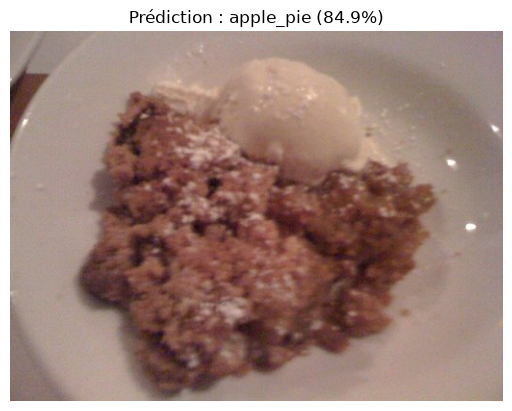

In [ ]:
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt


test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def predict(image_path, top_k=5):
    img = Image.open(image_path).convert("RGB")
    x = test_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(x)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_idxs = probs.topk(top_k, dim=1)

    print(f"Prédictions pour : {image_path}")
    for p, i in zip(top_probs[0], top_idxs[0]):
        print(f"  {classes[i]:30s} : {p.item():.2%}")

    # Affiche l'image
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prédiction : {classes[top_idxs[0][0]]} ({top_probs[0][0]:.1%})")
    plt.show()


predict("food/images/apple_pie/21063.jpg")

In [ ]:
import os, copy
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- 1. Recharger le modèle depuis le checkpoint phase 2 ---
model = models.resnet50(weights=None)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, len(classes))
model.load_state_dict(torch.load("checkpoints/food_resnet50_phase2_best.pth"))
model = model.to(device)


model.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(num_features, len(classes))
).to(device)


BATCH_SIZE_P3 = 64

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE_P3, shuffle=True,
    num_workers=4, pin_memory=True, persistent_workers=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE_P3, shuffle=False,
    num_workers=4, pin_memory=True, persistent_workers=True
)

torch.cuda.empty_cache()


for name, param in model.named_parameters():
    param.requires_grad = (
        "layer2" in name or "layer3" in name or "layer4" in name or "fc" in name
    )

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"Paramètres entraînables : {trainable:,} / {total:,} ({100*trainable/total:.1f}%)")

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

optimizer = optim.Adam([
    {"params": model.layer2.parameters(), "lr": 1e-6},
    {"params": model.layer3.parameters(), "lr": 1e-5},
    {"params": model.layer4.parameters(), "lr": 1e-5},
    {"params": model.fc.parameters(),     "lr": 1e-4},
], weight_decay=1e-4)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)
scaler = torch.amp.GradScaler('cuda')

# --- 5. Fonctions d'entraînement / évaluation (self-contained) ---
def train_one_epoch(model, loader, criterion, optimizer, device, scaler):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in tqdm(loader, desc="Training"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        optimizer.zero_grad()

        with torch.amp.autocast('cuda'):
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate(model, loader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Validation"):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            with torch.amp.autocast('cuda'):
                outputs = model(images)
                loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total


num_epochs_phase3 = 20
history_phase3 = []
best_val_acc_p3 = 0.8252   # score de référence à battre (phase 2)
best_model_state_p3 = None
patience_counter = 0
early_stop_patience = 5

os.makedirs("checkpoints", exist_ok=True)

for epoch in range(num_epochs_phase3):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device, scaler)
    val_loss, val_acc = evaluate(model, test_loader, criterion, device)
    scheduler.step(val_acc)

    current_lr = optimizer.param_groups[-1]['lr']
    print(f"Epoch {epoch+1}/{num_epochs_phase3} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | LR: {current_lr:.2e}")

    history_phase3.append({
        "epoch": epoch + 1, "train_loss": train_loss, "train_acc": train_acc,
        "val_loss": val_loss, "val_acc": val_acc, "lr": current_lr
    })

    if val_acc > best_val_acc_p3:
        best_val_acc_p3 = val_acc
        best_model_state_p3 = copy.deepcopy(model.state_dict())
        torch.save(best_model_state_p3, "checkpoints/food_resnet50_phase3_best.pth")
        patience_counter = 0
        print("  -> Nouveau meilleur score, checkpoint sauvegardé.")
    else:
        patience_counter += 1
        if patience_counter >= early_stop_patience:
            print(f"\nEarly stopping à l'epoch {epoch+1} (pas d'amélioration depuis {early_stop_patience} epochs)")
            break

print(f"\nPhase 3 terminée | Meilleure Val Acc : {best_val_acc_p3:.4f}")

if best_model_state_p3 is not None:
    print("La Phase 3 a amélioré le score -> utilise checkpoints/food_resnet50_phase3_best.pth")
else:
    print("La Phase 3 n'a PAS amélioré le score -> reste sur checkpoints/food_resnet50_phase2_best.pth")

Paramètres entraînables : 23,489,637 / 23,714,981 (99.0%)


Validation: 100%|██████████| 395/395 [01:23<00:00,  4.72it/s]


Epoch 1/20 | Train Loss: 2.6847 Acc: 0.5286 | Val Loss: 1.6572 Acc: 0.7600 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:16<00:00,  5.13it/s]


Epoch 2/20 | Train Loss: 1.7082 Acc: 0.7442 | Val Loss: 1.4870 Acc: 0.8022 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:22<00:00,  4.77it/s]


Epoch 3/20 | Train Loss: 1.5452 Acc: 0.7883 | Val Loss: 1.4188 Acc: 0.8191 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:21<00:00,  4.87it/s]


Epoch 4/20 | Train Loss: 1.4506 Acc: 0.8182 | Val Loss: 1.3840 Acc: 0.8280 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:23<00:00,  4.75it/s]


Epoch 5/20 | Train Loss: 1.3916 Acc: 0.8364 | Val Loss: 1.3626 Acc: 0.8345 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:23<00:00,  4.71it/s]


Epoch 6/20 | Train Loss: 1.3377 Acc: 0.8527 | Val Loss: 1.3540 Acc: 0.8352 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:21<00:00,  4.84it/s]


Epoch 7/20 | Train Loss: 1.2970 Acc: 0.8664 | Val Loss: 1.3384 Acc: 0.8392 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:14<00:00,  5.33it/s]


Epoch 8/20 | Train Loss: 1.2618 Acc: 0.8775 | Val Loss: 1.3314 Acc: 0.8421 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:21<00:00,  4.86it/s]


Epoch 9/20 | Train Loss: 1.2338 Acc: 0.8862 | Val Loss: 1.3333 Acc: 0.8425 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:14<00:00,  5.32it/s]


Epoch 10/20 | Train Loss: 1.2064 Acc: 0.8970 | Val Loss: 1.3285 Acc: 0.8430 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:21<00:00,  4.86it/s]


Epoch 11/20 | Train Loss: 1.1822 Acc: 0.9044 | Val Loss: 1.3243 Acc: 0.8436 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:24<00:00,  4.68it/s]


Epoch 12/20 | Train Loss: 1.1628 Acc: 0.9111 | Val Loss: 1.3256 Acc: 0.8444 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:22<00:00,  4.78it/s]


Epoch 13/20 | Train Loss: 1.1403 Acc: 0.9187 | Val Loss: 1.3195 Acc: 0.8457 | LR: 1.00e-04
  -> Nouveau meilleur score, checkpoint sauvegardé.


Validation: 100%|██████████| 395/395 [01:26<00:00,  4.56it/s]


Epoch 14/20 | Train Loss: 1.1239 Acc: 0.9241 | Val Loss: 1.3184 Acc: 0.8453 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.35it/s]


Epoch 15/20 | Train Loss: 1.1025 Acc: 0.9326 | Val Loss: 1.3248 Acc: 0.8421 | LR: 1.00e-04


Validation: 100%|██████████| 395/395 [01:27<00:00,  4.50it/s]


Epoch 16/20 | Train Loss: 1.0883 Acc: 0.9370 | Val Loss: 1.3257 Acc: 0.8433 | LR: 5.00e-05


Validation: 100%|██████████| 395/395 [01:30<00:00,  4.37it/s]


Epoch 17/20 | Train Loss: 1.0675 Acc: 0.9443 | Val Loss: 1.3196 Acc: 0.8448 | LR: 5.00e-05


Validation: 100%|██████████| 395/395 [01:32<00:00,  4.26it/s]

Epoch 18/20 | Train Loss: 1.0590 Acc: 0.9476 | Val Loss: 1.3192 Acc: 0.8444 | LR: 5.00e-05

Early stopping à l'epoch 18 (pas d'amélioration depuis 5 epochs)

Phase 3 terminée | Meilleure Val Acc : 0.8457
La Phase 3 a amélioré le score -> utilise checkpoints/food_resnet50_phase3_best.pth


In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(weights=None)
num_features = model.fc.in_features


model.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(num_features, len(classes))
)

model.load_state_dict(torch.load("checkpoints_food_resnet50_phase3_best.pth"))
model = model.to(device)
model.eval()

print("Modèle Phase 3 chargé.")

Modèle Phase 3 chargé.


In [14]:
from tqdm import tqdm

def evaluate_top1_top5(model, loader, device, k=5):
    model.eval()
    correct_top1, correct_topk, total = 0, 0, 0
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Éval Phase 3"):
            images, labels = images.to(device), labels.to(device)
            with torch.amp.autocast('cuda'):
                outputs = model(images)
            _, pred_top1 = torch.max(outputs, 1)
            _, pred_topk = outputs.topk(k, dim=1)
            correct_top1 += (pred_top1 == labels).sum().item()
            correct_topk += sum([labels[i] in pred_topk[i] for i in range(labels.size(0))])
            total += labels.size(0)
    top1 = correct_top1 / total
    topk = correct_topk / total
    print(f"Top-1 : {top1:.4f} | Top-{k} : {topk:.4f}")
    return top1, topk

top1_p3, top5_p3 = evaluate_top1_top5(model, test_loader, device)

Éval Phase 3: 100%|██████████| 395/395 [01:36<00:00,  4.10it/s]

Top-1 : 0.8457 | Top-5 : 0.9653


Prédictions pour : food/images/cheese_plate/10057.jpg
  cheese_plate                   : 93.51%
  carrot_cake                    : 0.81%
  cheesecake                     : 0.61%
  hummus                         : 0.56%
  beef_tartare                   : 0.49%


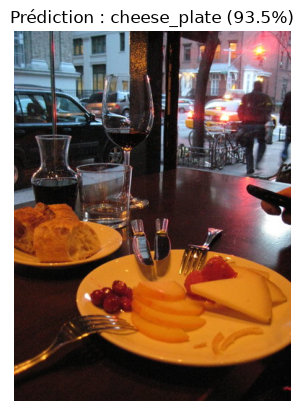

In [ ]:
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def predict(image_path, top_k=5):
    img = Image.open(image_path).convert("RGB")
    x = test_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        with torch.amp.autocast('cuda'):
            outputs = model(x)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_idxs = probs.topk(top_k, dim=1)

    print(f"Prédictions pour : {image_path}")
    for p, i in zip(top_probs[0], top_idxs[0]):
        print(f"  {classes[i]:30s} : {p.item():.2%}")

    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prédiction : {classes[top_idxs[0][0]]} ({top_probs[0][0]:.1%})")
    plt.show()

predict("food/images/cheese_plate/10057.jpg")

In [17]:
import json

checkpoint = {
    "model_state_dict": model.state_dict(),
    "class_to_idx": {c: i for i, c in enumerate(classes)},
    "idx_to_class": {i: c for i, c in enumerate(classes)},
    "num_classes": len(classes),
    "architecture": "resnet50_dropout",   # important : rappelle qu'il faut le Sequential(Dropout, Linear)
    "top1_acc": top1_p3,
    "top5_acc": top5_p3,
    "input_size": 224,
    "normalize_mean": [0.485, 0.456, 0.406],
    "normalize_std": [0.229, 0.224, 0.225],
}

torch.save(checkpoint, "checkpoints/food_resnet50_final.pth")
print(f"Checkpoint final sauvegardé | Top-1: {top1_p3:.4f} | Top-5: {top5_p3:.4f}")

Checkpoint final sauvegardé | Top-1: 0.8457 | Top-5: 0.9653


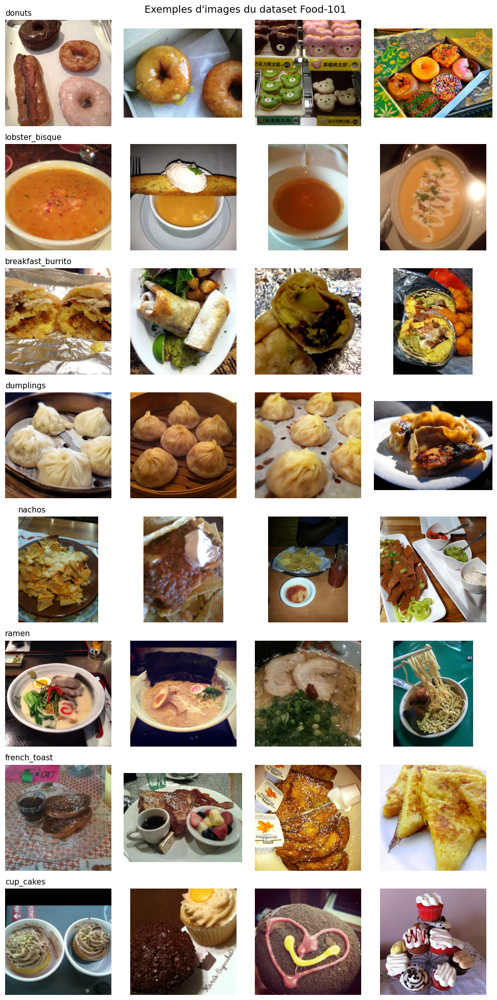

In [18]:
import matplotlib.pyplot as plt
from PIL import Image
import random

def show_class_examples(classes, images_dir, n_classes=8, n_examples=4):
    fig, axes = plt.subplots(n_classes, n_examples, figsize=(n_examples*2.5, n_classes*2.5))
    sample_classes = random.sample(classes, n_classes)

    for row, cls in enumerate(sample_classes):
        cls_dir = os.path.join(images_dir, cls)
        files = os.listdir(cls_dir)[:n_examples]
        for col, f in enumerate(files):
            img = Image.open(os.path.join(cls_dir, f))
            axes[row, col].imshow(img)
            axes[row, col].axis("off")
            if col == 0:
                axes[row, col].set_ylabel(cls, fontsize=10)
        axes[row, 0].set_title(cls, fontsize=11, loc='left')

    plt.suptitle("Exemples d'images du dataset Food-101", fontsize=14)
    plt.tight_layout()
    plt.savefig("report_dataset_examples.png", dpi=150, bbox_inches="tight")
    plt.show()

show_class_examples(classes, IMAGES_DIR)

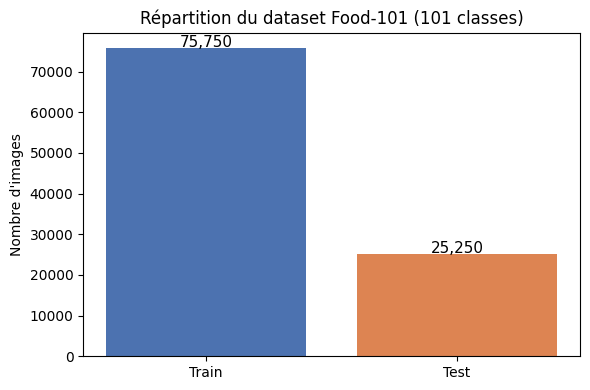

Total images : 101,000
Images par classe (train) : ~750


In [19]:
import matplotlib.pyplot as plt

labels = ["Train", "Test"]
counts = [len(train_files), len(test_files)]

plt.figure(figsize=(6,4))
bars = plt.bar(labels, counts, color=["#4C72B0", "#DD8452"])
for bar, c in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, c + 200, f"{c:,}", ha="center", fontsize=11)
plt.ylabel("Nombre d'images")
plt.title(f"Répartition du dataset Food-101 ({len(classes)} classes)")
plt.tight_layout()
plt.savefig("report_dataset_split.png", dpi=150)
plt.show()

print(f"Total images : {len(train_files) + len(test_files):,}")
print(f"Images par classe (train) : ~{len(train_files)//len(classes)}")

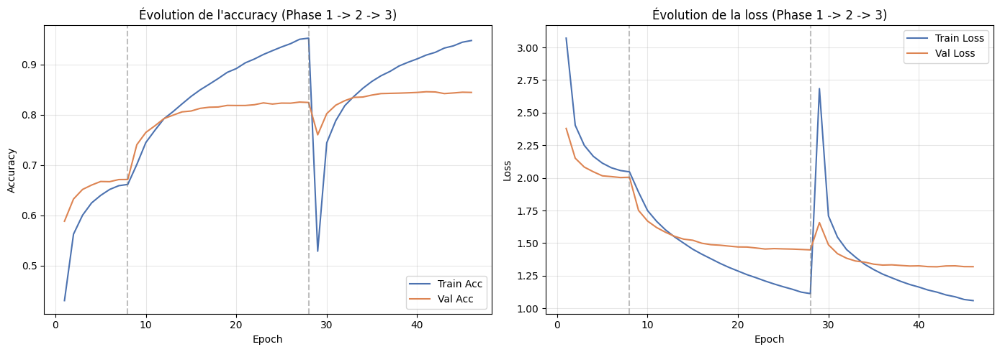

In [20]:
import matplotlib.pyplot as plt

def plot_training_curves(history_p1, history_p2, history_p3):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    all_train_acc, all_val_acc = [], []
    all_train_loss, all_val_loss = [], []
    phase_boundaries = []

    for h in [history_p1, history_p2, history_p3]:
        all_train_acc += [e["train_acc"] for e in h]
        all_val_acc += [e["val_acc"] for e in h]
        all_train_loss += [e["train_loss"] for e in h]
        all_val_loss += [e["val_loss"] for e in h]
        phase_boundaries.append(len(all_train_acc))

    epochs = range(1, len(all_train_acc) + 1)

    # Accuracy
    axes[0].plot(epochs, all_train_acc, label="Train Acc", color="#4C72B0")
    axes[0].plot(epochs, all_val_acc, label="Val Acc", color="#DD8452")
    for b in phase_boundaries[:-1]:
        axes[0].axvline(x=b, color="gray", linestyle="--", alpha=0.5)
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_title("Évolution de l'accuracy (Phase 1 -> 2 -> 3)")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # Loss
    axes[1].plot(epochs, all_train_loss, label="Train Loss", color="#4C72B0")
    axes[1].plot(epochs, all_val_loss, label="Val Loss", color="#DD8452")
    for b in phase_boundaries[:-1]:
        axes[1].axvline(x=b, color="gray", linestyle="--", alpha=0.5)
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Loss")
    axes[1].set_title("Évolution de la loss (Phase 1 -> 2 -> 3)")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig("report_training_curves.png", dpi=150)
    plt.show()

plot_training_curves(history_phase1, history_phase2, history_phase3)

In [ ]:
import pandas as pd

summary = pd.DataFrame({
    "Phase": ["Phase 1 (tête seule)", "Phase 2 (fine-tuning layer3/4)", "Phase 3 (+ dropout + layer2)"],
    "Val Accuracy (Top-1)": [0.7600, 0.8252, 0.8457],   
    "Top-5 Accuracy": [None, 0.9546, 0.9653],
})
print(summary.to_string(index=False))
summary.to_csv("report_summary_table.csv", index=False)

                         Phase  Val Accuracy (Top-1)  Top-5 Accuracy
          Phase 1 (tête seule)                0.7600             NaN
Phase 2 (fine-tuning layer3/4)                0.8252          0.9546
  Phase 3 (+ dropout + layer2)                0.8457          0.9653


In [24]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(weights=None)
num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(num_features, len(classes))
)
model.load_state_dict(torch.load("checkpoints/food_resnet50_phase3_best.pth"))
model = model.to(device)
model.eval()

print("Modèle Phase 3 chargé.")

Modèle Phase 3 chargé.


In [25]:
from tqdm import tqdm

def get_all_predictions(model, loader, device):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Génération des prédictions"):
            images = images.to(device)
            with torch.amp.autocast('cuda'):
                outputs = model(images)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())
    return all_labels, all_preds

all_labels, all_preds = get_all_predictions(model, test_loader, device)
print(f"Total prédictions : {len(all_preds)}")

Génération des prédictions: 100%|██████████| 395/395 [01:38<00:00,  4.03it/s]

Total prédictions : 25250


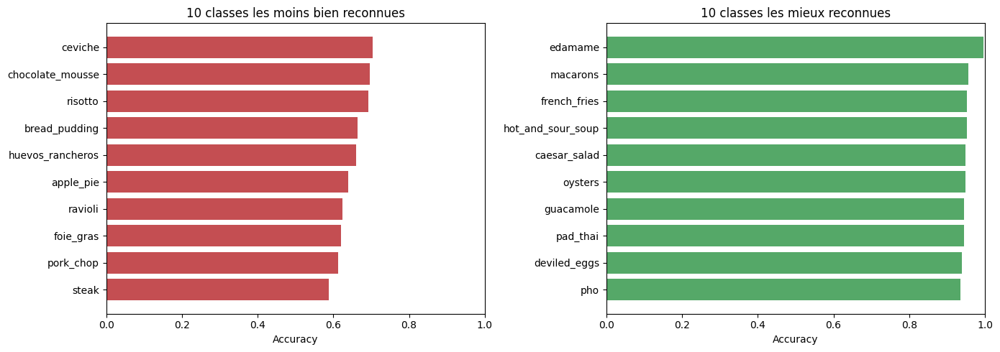

In [26]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(all_labels, all_preds)
per_class_acc = np.diag(cm) / cm.sum(axis=1)

sorted_idx = np.argsort(per_class_acc)
worst_10 = sorted_idx[:10]
best_10 = sorted_idx[-10:]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].barh([classes[i] for i in worst_10], per_class_acc[worst_10], color="#C44E52")
axes[0].set_xlabel("Accuracy")
axes[0].set_title("10 classes les moins bien reconnues")
axes[0].set_xlim(0, 1)

axes[1].barh([classes[i] for i in best_10], per_class_acc[best_10], color="#55A868")
axes[1].set_xlabel("Accuracy")
axes[1].set_title("10 classes les mieux reconnues")
axes[1].set_xlim(0, 1)

plt.tight_layout()
plt.savefig("report_class_performance.png", dpi=150)
plt.show()

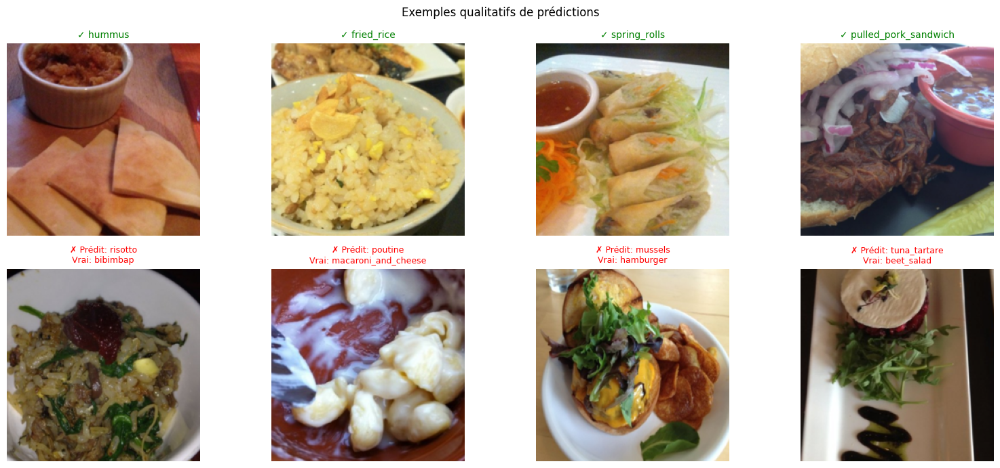

In [27]:
import matplotlib.pyplot as plt
import numpy as np

def show_predictions_grid(model, dataset, classes, device, n_correct=4, n_wrong=4):
    model.eval()
    correct_examples, wrong_examples = [], []

    indices = list(range(len(dataset)))
    random.shuffle(indices)

    with torch.no_grad():
        for idx in indices:
            if len(correct_examples) >= n_correct and len(wrong_examples) >= n_wrong:
                break
            img_tensor, label = dataset[idx]
            x = img_tensor.unsqueeze(0).to(device)
            with torch.amp.autocast('cuda'):
                output = model(x)
            pred = output.argmax(1).item()

            if pred == label and len(correct_examples) < n_correct:
                correct_examples.append((idx, pred, label))
            elif pred != label and len(wrong_examples) < n_wrong:
                wrong_examples.append((idx, pred, label))

    fig, axes = plt.subplots(2, max(n_correct, n_wrong), figsize=(16, 7))

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    def unnormalize(img_tensor):
        img = img_tensor.permute(1,2,0).numpy()
        img = std * img + mean
        return np.clip(img, 0, 1)

    for col, (idx, pred, label) in enumerate(correct_examples):
        img_tensor, _ = dataset[idx]
        axes[0, col].imshow(unnormalize(img_tensor))
        axes[0, col].set_title(f"✓ {classes[pred]}", color="green", fontsize=10)
        axes[0, col].axis("off")

    for col, (idx, pred, label) in enumerate(wrong_examples):
        img_tensor, _ = dataset[idx]
        axes[1, col].imshow(unnormalize(img_tensor))
        axes[1, col].set_title(f"✗ Prédit: {classes[pred]}\nVrai: {classes[label]}", color="red", fontsize=9)
        axes[1, col].axis("off")

    axes[0, 0].set_ylabel("Correctes", fontsize=12)
    axes[1, 0].set_ylabel("Erreurs", fontsize=12)

    plt.suptitle("Exemples qualitatifs de prédictions")
    plt.tight_layout()
    plt.savefig("report_qualitative_examples.png", dpi=150)
    plt.show()

show_predictions_grid(model, test_dataset, classes, device)

In [6]:
with open("food/meta/meta/classes.txt") as f:
    classes = [line.strip() for line in f.readlines()]
print(len(classes))  # doit donner 101

101


In [7]:
!pip install python-dotenv -q


[notice] A new release of pip is available: 26.1.2 -> 26.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [37]:
import os
import time
import json
import requests

APP_ID = os.getenv("EDAMAM_APP_ID")
APP_KEY = os.getenv("EDAMAM_APP_KEY")

In [38]:
from dotenv import load_dotenv
load_dotenv(override=True)

FOOD_DB_APP_ID = os.getenv("EDAMAM_FOOD_DB_APP_ID")
FOOD_DB_APP_KEY = os.getenv("EDAMAM_FOOD_DB_APP_KEY")

In [39]:
def clean_class_name(cls):
    """food-101 class -> texte lisible pour l'API nutrition (ex: 'cheese_plate' -> 'cheese plate')."""
    return cls.replace("_", " ")

In [ ]:
def request_with_backoff(url, params, max_retries=5, base_wait=20):
    """Réessaie automatiquement en cas de 429, en attendant de plus en plus longtemps."""
    r = None
    for attempt in range(max_retries):
        r = requests.get(url, params=params)
        if r.status_code == 429:
            wait = int(r.headers.get("Retry-After", base_wait * (attempt + 1)))
            print(f"    -> 429 rate limit, attente {wait}s (tentative {attempt+1}/{max_retries})")
            time.sleep(wait)
            continue
        return r
    return r  

def get_nutrition_food_database(food_name):
    """API Food Database d'Edamam (endpoint 'parser') : recherche un aliment par nom."""
    url = "https://api.edamam.com/api/food-database/v2/parser"
    params = {
        "app_id": FOOD_DB_APP_ID,
        "app_key": FOOD_DB_APP_KEY,
        "ingr": food_name,
        "nutrition-type": "logging",
    }
    r = request_with_backoff(url, params)
    if r.status_code != 200:
        return None
    data = r.json()
    hints = data.get("hints", [])
    if not hints:
        return None
    food = hints[0]["food"]
    nutrients = food.get("nutrients", {})
    if not nutrients.get("ENERC_KCAL"):
        return None
    return {
        "calories": nutrients.get("ENERC_KCAL"),
        "protein_g": nutrients.get("PROCNT"),
        "carbs_g": nutrients.get("CHOCDF"),
        "fat_g": nutrients.get("FAT"),
        "matched_label": food.get("label"),
    }

In [41]:
def nutrition_query_variants(food_name):
    return [
        f"100g {food_name}",
        f"1 serving {food_name}",
        food_name,
    ]

In [ ]:
def get_nutrition_edamam_robust(food_name, verbose=False):
    """Essaie d'abord Food Database (bien adapté aux plats composés),
    puis Nutrition Analysis en secours (utile pour des ingrédients simples)."""
    result = get_nutrition_food_database(food_name)
    if result is not None:
        return result

    if verbose:
        print(f"  [{food_name}] Food Database sans résultat, essai Nutrition Analysis...")

    
    query = f"100g {food_name}"
    url = "https://api.edamam.com/api/nutrition-data"
    params = {"app_id": APP_ID, "app_key": APP_KEY, "ingr": query}
    r = request_with_backoff(url, params)
    if r.status_code != 200:
        return None
    data = r.json()
    if data.get("calories"):
        return {
            "calories": data.get("calories"),
            "protein_g": data.get("totalNutrients", {}).get("PROCNT", {}).get("quantity"),
            "carbs_g": data.get("totalNutrients", {}).get("CHOCDF", {}).get("quantity"),
            "fat_g": data.get("totalNutrients", {}).get("FAT", {}).get("quantity"),
            "matched_query": query,
        }
    return None

In [ ]:
NUTRITION_DB_PATH = "food_nutrition_db.json"
REQUESTS_PER_MINUTE = 5   
SLEEP_BETWEEN_CALLS = 60 / REQUESTS_PER_MINUTE

def load_nutrition_db(path=NUTRITION_DB_PATH):
    if os.path.exists(path):
        with open(path, "r") as f:
            return json.load(f)
    return {}

def save_nutrition_db(db, path=NUTRITION_DB_PATH):
    with open(path, "w") as f:
        json.dump(db, f, indent=2, ensure_ascii=False)

In [45]:
def build_nutrition_db_for_all_classes(classes, verbose=True):
    db = load_nutrition_db()
    missing = []
    for i, cls in enumerate(classes):
        if cls in db:
            continue
        food_name = clean_class_name(cls)
        result = get_nutrition_edamam_robust(food_name, verbose=verbose)
        if result is not None:
            db[cls] = result
            if verbose:
                print(f"[{i+1}/{len(classes)}] OK  {cls:30s} -> {result['calories']:.0f} kcal/100g")
        else:
            missing.append(cls)
            if verbose:
                print(f"[{i+1}/{len(classes)}] ÉCHEC {cls:30s} -> aucune donnée trouvée")
        save_nutrition_db(db)
        time.sleep(SLEEP_BETWEEN_CALLS)
    return db, missing

In [46]:
print(get_nutrition_food_database("baby back ribs"))

{'calories': 224.0, 'protein_g': 19.1, 'carbs_g': 0.0, 'fat_g': 16.3, 'matched_label': 'Pork Baby Back Ribs'}


In [47]:
nutrition_db, missing_classes = build_nutrition_db_for_all_classes(classes)

print(f"\nRésumé : {len(nutrition_db)}/{len(classes)} classes avec données nutritionnelles.")
if missing_classes:
    print(f"Classes sans données ({len(missing_classes)}) :", missing_classes)

[4/101] OK  beef_carpaccio                 -> 262 kcal/100g
[9/101] OK  bread_pudding                  -> 205 kcal/100g
[10/101] OK  breakfast_burrito              -> 188 kcal/100g
[11/101] OK  bruschetta                     -> 154 kcal/100g
[16/101] OK  ceviche                        -> 70 kcal/100g
[17/101] OK  cheesecake                     -> 321 kcal/100g
[18/101] OK  cheese_plate                   -> 403 kcal/100g
    -> 429 rate limit, attente 20s (tentative 1/5)
[19/101] OK  chicken_curry                  -> 136 kcal/100g
[24/101] OK  churros                        -> 337 kcal/100g
[25/101] OK  clam_chowder                   -> 114 kcal/100g
[26/101] OK  club_sandwich                  -> 196 kcal/100g
[27/101] OK  crab_cakes                     -> 183 kcal/100g
[32/101] OK  donuts                         -> 421 kcal/100g
[33/101] OK  dumplings                      -> 224 kcal/100g
[34/101] OK  edamame                        -> 121 kcal/100g
    -> 429 rate limit, attente 20s (t

In [48]:
db = load_nutrition_db()
print(f"Classes dans la base : {len(db)}/101")

missing = [c for c in classes if c not in db]
print(f"Classes manquantes : {missing}")

# Aperçu de quelques entrées
import random
for cls in random.sample(list(db.keys()), 5):
    print(cls, "->", db[cls])

Classes dans la base : 101/101
Classes manquantes : []
pizza -> {'calories': 268.0, 'protein_g': 10.4, 'carbs_g': 29.0, 'fat_g': 12.3, 'matched_label': 'Pizza'}
nachos -> {'calories': 196.47273996409947, 'protein_g': 7.6282831857283995, 'carbs_g': 16.263807988773944, 'fat_g': 11.694862482375015, 'matched_label': 'Nachos'}
sushi -> {'calories': 131.3403599756207, 'protein_g': 4.15326111007466, 'carbs_g': 22.014615761630875, 'fat_g': 2.748135093143514, 'matched_label': 'Sushi'}
mussels -> {'calories': 86.0, 'protein_g': 11.9, 'carbs_g': 3.69, 'fat_g': 2.24, 'matched_label': 'Mussels'}
bread_pudding -> {'calories': 204.59365007237545, 'protein_g': 4.890874978948047, 'carbs_g': 28.265771695848656, 'fat_g': 8.13309332635403, 'matched_label': 'Bread Pudding'}
